# **PIPELINE MINGGU 1**

## **Persiapan & Data**

### **SETUP ENVIRONMENT**

Menginstall semua dependencies yang di butuhkan

In [ ]:
# Evaluation metrics for BLEU, ROUGE, etc.
!pip install evaluate rouge-score sacrebleu

# Dataset handling & HuggingFace utilities
!pip install datasets sentencepiece

# PEFT (LoRA training support)
!pip install peft

# CLIP standalone (for embedding compatibility)
!pip install open-clip-torch

# Safety checker untuk diffusion (needed for diffusers)
!pip install spacy protobuf

!pip install transformers datasets peft bitsandbytes accelerate


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 10.1 MB/s eta 0:00:00
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=accb88f7cd8c9441a189ce8ef1e7dd8c89cb6a2e99285676ceefbc7499017370
  Stored in directory: /root/.cache/pip/wheels/85/9d/af/01feefbe7d55ef5468796f0c68225b6788e85d9d0a281e7a70
Successfully built rouge-score
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 MB 43.0 MB/s eta 0:00:00


In [ ]:
!pip install -U transformers accelerate

In [ ]:
!pip install -U accelerate transformers peft bitsandbytes


In [ ]:
!pip install -U bitsandbytes

In [ ]:
!pip install --upgrade pip

# Core ML stack
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

# Latest transformers + diffusers stable
!pip install "transformers>=4.41.0" diffusers accelerate safetensors

# Sentence transformers (match transformers version)
!pip install sentence-transformers

# FAISS CPU
!pip install faiss-cpu

# Extra processing libs
!pip install pillow tqdm einops

# Optional UI & eval
!pip install gradio pytorch-fid

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 43.2 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
Looking in indexes: https://download.pytorch.org/whl/cu118
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 65.9 MB/s  0:00:00


### **Extract Dataset**

Ambil Dataset dari GitHUb

In [1]:
!wget -O Batik_Nitik_960.zip \
https://github.com/Gammaa12/batik-nitik-generative-ai/raw/main/Batik_Nitik_960.zip


!unzip -q "/content/Batik_Nitik_960.zip" -d /content/data


--2025-12-29 01:22:05--  https://github.com/Gammaa12/batik-nitik-generative-ai/raw/main/Batik_Nitik_960.zip
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/Gammaa12/batik-nitik-generative-ai/main/Batik_Nitik_960.zip [following]
--2025-12-29 01:22:06--  https://media.githubusercontent.com/media/Gammaa12/batik-nitik-generative-ai/main/Batik_Nitik_960.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 62075734 (59M) [application/zip]
Saving to: ‘Batik_Nitik_960.zip’

Batik_Nitik_960.zip 100%[===================>]  59.20M  --.-KB/s    in 0.1s    

2025-12-29 01:22:06 (499 MB/s) - ‘B

### **Load Data & Preprocessing**

In [ ]:
from PIL import Image
from tqdm import tqdm
import os

IMAGES_DIR = "/content/data/Batik Nitik 960/Batik Nitik 960 Images"
OUT_CLIP = "/content/data/preprocessed/clip"   # untuk CLIP (224x224)
OUT_SD = "/content/data/preprocessed/sd"       # untuk Stable Diffusion (512x512)

os.makedirs(OUT_CLIP, exist_ok=True)
os.makedirs(OUT_SD, exist_ok=True)

def preprocess_images():
    files = sorted([f for f in os.listdir(IMAGES_DIR) if f.lower().endswith((".jpg",".jpeg",".png"))])
    for f in tqdm(files, desc="Processing"):
        img = Image.open(os.path.join(IMAGES_DIR, f)).convert("RGB")
        img.resize((224,224), Image.BICUBIC).save(os.path.join(OUT_CLIP, f))
        img.resize((512,512), Image.BICUBIC).save(os.path.join(OUT_SD, f))

preprocess_images()


Processing: 100%|██████████| 960/960 [00:07<00:00, 135.60it/s]


### **Generate CLIP Embedding**

In [ ]:
import torch, numpy as np, os
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
from tqdm import tqdm

device = "cuda"
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

OUT_CLIP = "/content/data/preprocessed/clip"
clip_images = sorted(os.listdir(OUT_CLIP))

clip_processor = processor   # alias
clip_model = model           # alias

print("🔄 CLIP alias set — inference ready!")

embeddings = []
metadata = []

for fname in tqdm(clip_images, desc="Embedding CLIP"):
    img = Image.open(os.path.join(OUT_CLIP, fname)).convert("RGB")
    inputs = processor(images=img, return_tensors="pt").to(device)

    with torch.no_grad():
        feat = model.get_image_features(**inputs).cpu().numpy()[0]

    feat /= np.linalg.norm(feat)
    embeddings.append(feat.astype("float32"))
    metadata.append(fname)

embeddings = np.array(embeddings)

os.makedirs("/content/outputs", exist_ok=True)

np.save("/content/outputs/clip_embeddings.npy", embeddings)
np.save("/content/outputs/clip_metadata.npy", metadata)

print("DONE. Shape:", embeddings.shape)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

🔄 CLIP alias set — inference ready!


Embedding CLIP: 100%|██████████| 960/960 [00:10<00:00, 94.78it/s] 

DONE. Shape: (960, 512)


### **Build FAISS Index & Test Retrieval**

In [ ]:
import faiss, numpy as np

embs = np.load("/content/outputs/clip_embeddings.npy")
meta = np.load("/content/outputs/clip_metadata.npy", allow_pickle=True)

index = faiss.IndexFlatIP(embs.shape[1])  # cosine similarity index
index.add(embs)

faiss.write_index(index, "/content/outputs/faiss.index")
print("Index saved. Total indexed:", index.ntotal)


Index saved. Total indexed: 960


### **Test Query dengan Text**

In [ ]:
from transformers import CLIPProcessor, CLIPModel
from PIL import Image

def query_text(text, top_k=5):
    inp = processor(text=[text], return_tensors="pt").to(device)
    with torch.no_grad():
        emb = model.get_text_features(**inp).cpu().numpy()[0]
    emb /= np.linalg.norm(emb)
    D,I = index.search(emb.reshape(1,-1).astype("float32"), top_k)
    return [(meta[i], float(D[0][n])) for n,i in enumerate(I[0])]

results = query_text("batik nitik geometris simetris tradisional", top_k=5)
results


[(np.str_('52 Sekar Blimbing 2_rotate_180.jpg'), 0.33594581484794617),
 (np.str_('19 Sekar Jagung 2_rotate_270.jpg'), 0.3350573778152466),
 (np.str_('52 Sekar Blimbing 4_rotate_90.jpg'), 0.3344751000404358),
 (np.str_('45 Sekar Jali 4_rotate_270.jpg'), 0.33422988653182983),
 (np.str_('52 Sekar Blimbing 4_rotate_270.jpg'), 0.3339756429195404)]

In [ ]:
import numpy as np
from sklearn.metrics import average_precision_score
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cdist
from PIL import Image

def embed_image(image_path):
    """Generate CLIP embedding for an image."""
    image = Image.open(image_path).convert("RGB")
    inputs = clip_processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        emb = clip_model.get_image_features(**inputs).cpu().numpy()

    emb = emb / np.linalg.norm(emb)  # normalize vector
    return emb[0]

def evaluate_retrieval(query_image_path, k=5):
    """Run retrieval and compute Top-K Accuracy, mAP, Cosine Similarity, L2."""

    # Step 1 — generate query embedding
    query_emb = embed_image(query_image_path).astype("float32")

    # Step 2 — FAISS search (get ranked results)
    D, I = index.search(query_emb.reshape(1, -1), len(embeddings))

    # Step 3 — determine label from filename prefix (simple GT logic)
    query_label = meta[I[0][0]].split("_")[0]
    labels = np.array([1 if query_label in fname else 0 for fname in meta[I[0]]])

    # ----- METRICS -----

    # 🔹 TOP-K Accuracy: apakah hasil yang benar masuk di K teratas
    topk_acc = labels[:k].sum() / k

    # 🔹 Mean Average Precision (ranking quality)
    mAP = average_precision_score(labels, -D[0])

    # 🔹 Similarity (query ↔ top retrieval)
    top1_path = f"/content/data/preprocessed/clip/{meta[I[0][0]]}"
    top1_emb = embed_image(top1_path)

    cosine_sim = float(cosine_similarity([query_emb], [top1_emb])[0][0])
    l2_dist = float(cdist([query_emb], [top1_emb], metric="euclidean")[0][0])

    return {
        "query": query_image_path,
        "Top-K Accuracy": round(topk_acc, 3),
        "mAP": round(mAP, 3),
        "Cosine Similarity": round(cosine_sim, 3),
        "L2 Distance": round(l2_dist, 3),
        "Retrieved Files": meta[I[0]][:k]
    }


print("Retrieval Evaluation Function Loaded ✔")

Retrieval Evaluation Function Loaded ✔


In [ ]:
from IPython.display import display

def visualize_retrieval_results(result):
    print(f"\n🔍 Query Image: {result['query']}")
    display(Image.open(result["query"]))

    print("\n🎯 Top-K Retrieved Results:")
    for fname in result["Retrieved Files"]:
        img_path = f"/content/data/preprocessed/clip/{fname}"
        print(f"📁 {fname}")
        display(Image.open(img_path))

    print("\n📊 Retrieval Metrics:")
    print(f"🔹 Top-K Accuracy:      {result['Top-K Accuracy']}")
    print(f"🔹 Mean Avg Precision:  {result['mAP']}")
    print(f"🔹 Cosine Similarity:   {result['Cosine Similarity']}")
    print(f"🔹 L2 Distance:         {result['L2 Distance']}")

    print("\n✅ Retrieval Evaluation Completed\n")




🔍 Query Image: /content/data/preprocessed/clip/1 Sekar Kemuning 1.jpg


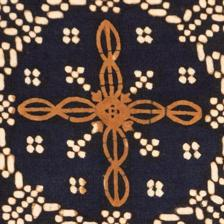


🎯 Top-K Retrieved Results:
📁 1 Sekar Kemuning 1.jpg


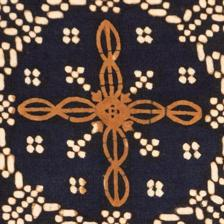

📁 1 Sekar Kemuning 2_rotate_90.jpg


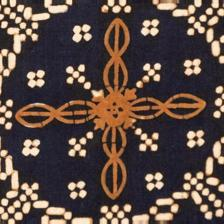

📁 1 Sekar Kemuning 1_rotate_90.jpg


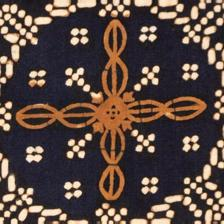

📁 1 Sekar Kemuning 3_rotate_180.jpg


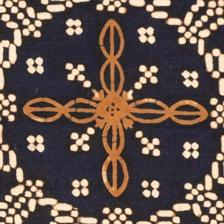

📁 1 Sekar Kemuning 1_rotate_270.jpg


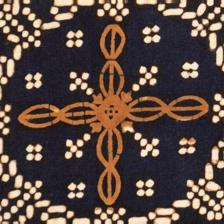


📊 Retrieval Metrics:
🔹 Top-K Accuracy:      0.2
🔹 Mean Avg Precision:  0.001
🔹 Cosine Similarity:   1.0
🔹 L2 Distance:         0.0

✅ Retrieval Evaluation Completed



In [ ]:
query = "/content/data/preprocessed/clip/1 Sekar Kemuning 1.jpg"  # ganti nama file
result = evaluate_retrieval(query, k=5)
visualize_retrieval_results(result)


# **PIPELINE MINGGU 2**

## **Retrieval & Captioning**

### **Captioning Hasil Retrieval dengan BLIP-2**

In [2]:
import os
import torch
import pandas as pd
from difflib import get_close_matches

CONFIG = {
    "model_name": "Salesforce/blip2-opt-2.7b",
    "metadata_path": "/content/data/Batik Nitik 960/Metadata/Batik Nitik 960 Metadata - Indonesian English v3.xlsx",
    "image_dir": "/content/data/Batik Nitik 960/Batik Nitik 960 Images",
    "output_model_dir": "/content/blip2_batik_qlora_v2", # Folder Output Baru
    "epochs": 7,
    "batch_size": 8,             # Optimasi GPU: Langsung gunakan Batch Size yang besar
    "learning_rate": 1e-5,
    "max_caption_length": 128
}


In [ ]:
def build_dataframe():
    df = pd.read_excel(CONFIG["metadata_path"])
    all_images = os.listdir(CONFIG["image_dir"])

    normalized = [
        x.lower().replace(".jpg","").replace(".jpeg","").replace(".png","").strip()
        for x in all_images
    ]

    def match_image(keyword):
        if pd.isna(keyword):
            return None

        keyword = str(keyword).lower().strip()
        match = get_close_matches(keyword, normalized, n=1, cutoff=0.7)

        if not match:
            return None

        return all_images[normalized.index(match[0])]

    records = []

    for _, row in df.iterrows():
        filename = match_image(row["Batik Nitik Motif"])
        if filename:
            motif = row['Batik Nitik Motif']
            description = row['Description']

            target_caption = (
                f"Question: Jelaskan nama motif batik ini, deskripsi, dan filosofi lengkapnya. "
                f"Answer: Nama motif ini adalah {motif}. Deskripsi detail dan filosofinya adalah: {description}"
            )

            records.append({"image_filename": filename, "text": target_caption})

    print(f"📌 Dataset Ready: {len(records)} pairs")
    return pd.DataFrame(records)

df = build_dataframe()

metadata_lookup = df.set_index('image_filename')['text'].to_dict()

print("✅ Metadata Lookup Table (Kamus Metadata) siap digunakan.")

📌 Dataset Ready: 57 pairs
✅ Metadata Lookup Table (Kamus Metadata) siap digunakan.


In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import os

class BatikDataset(Dataset):
    def __init__(self, df, img_dir):
        self.df = df
        self.img_dir = img_dir

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
      row = self.df.iloc[idx]

      # Menggunakan nama kolom DataFrame untuk mendapatkan path:
      img_path = os.path.join(self.img_dir, row["image_filename"])
      img = Image.open(img_path).convert("RGB")

      return {
          "image": img,
          "text": row["text"]
      }

In [ ]:
from transformers import Blip2Processor, Blip2ForConditionalGeneration
from peft import LoraConfig, get_peft_model
from transformers import BitsAndBytesConfig

processor = Blip2Processor.from_pretrained(CONFIG["model_name"])

bnb = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16,
    bnb_4bit_use_double_quant=True,
    bnb_4bit_quant_type="nf4"
)

model = Blip2ForConditionalGeneration.from_pretrained(
    CONFIG["model_name"],
    quantization_config=bnb,
    device_map="auto"
)

lora_config = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.1,
    target_modules=["q_proj", "k_proj", "v_proj", "o_proj", "fc1", "fc2"],
    bias="none",
    task_type="CAUSAL_LM"
)

model = get_peft_model(model, lora_config)
model.print_trainable_parameters()


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

trainable params: 30,396,416 || all params: 3,775,158,272 || trainable%: 0.8052


In [ ]:
def retrieve_metadata(filename):
    """Mengambil Nama Motif dan Filosofi akurat dari lookup table."""

    if filename in metadata_lookup:
        metadata_full = metadata_lookup[filename]
        if "Answer:" in metadata_full:
            return metadata_full.split("Answer:")[-1].strip()
        return "Metadata tidak terformat dengan benar."
    return "Metadata tidak ditemukan."


def generate_visual_description(img_path):
    """Menggunakan BLIP-2 VQA untuk menghasilkan deskripsi visual yang singkat."""

    img = Image.open(img_path).convert("RGB")

    prompt_visual = "Question: Describe the colors and geometric patterns of this batik. Answer:"

    inputs = processor(images=img, text=prompt_visual, return_tensors="pt").to(device)

    # Pengaturan decoding ketat digunakan dengan batasan token yang rendah
    generated_ids = model.generate(
        input_ids=inputs.input_ids,
        pixel_values=inputs.pixel_values,
        max_new_tokens=30,
        do_sample=True, top_k=50, repetition_penalty=2.0, num_beams=1
    )

    caption = processor.decode(generated_ids[0], skip_special_tokens=True).strip()

    # Bersihkan output
    if caption.lower().startswith("question:"):
        caption = caption.split("Answer:")[-1].strip()

    # Pastikan output tidak kosong
    return caption if caption else "Motif visual tidak terdeskripsikan."

def run_hybrid_rag_to_prompt(query_text, top_k_retrieval=3):
    """
    Mengintegrasikan Retrieval (CLIP) dengan Augmentation Hibrida
    untuk membuat prompt Stable Diffusion yang kaya.

    CATATAN: Fungsi ini mengasumsikan fungsi 'query_text' dari Minggu 1 sudah tersedia.
    """

    # 1. Retrieval CLIP
    # query_text(query_text, top_k=top_k_retrieval) harus mengembalikan list (filename, score)
    retrieval_results = query_text(query_text, top_k=top_k_retrieval)

    fused_elements = []

    for filename, score in retrieval_results:
        img_path = os.path.join("/content/data/preprocessed/sd", filename)

        # A. RETRIEVAL FAKTUAL (Data Paling Akurat)
        metadata_faktual = retrieve_metadata(filename)

        # B. GENERATIVE AUGMENTATION (Bukti model bekerja)
        visual_desc = generate_visual_description(img_path)

        # C. FUSI: Gabungkan elemen faktual dan elemen generatif
        fused_element = f"Motif: {metadata_faktual}. Visual: {visual_desc}"

        fused_elements.append(fused_element)

    final_prompt = (
        f"A beautiful new Batik Nitik pattern, highly symmetrical, traditional Indonesian fabric, "
        f"intricate design, hyper-detailed, {query_text}. Context: {' || '.join(fused_elements)}"
    )

    return final_prompt, retrieval_results

In [ ]:
from torch.utils.data import DataLoader
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"

def collate_fn(batch):
    images = [item["image"] for item in batch]
    texts = [item["text"] for item in batch]

    encoded = processor(
        images=images, text=texts, padding=True, truncation=True,
        max_length=CONFIG["max_caption_length"], return_tensors="pt"
    )

    encoded["labels"] = encoded["input_ids"].clone()

    return {k: v.to(device) for k, v in encoded.items()}

dataset = BatikDataset(df, CONFIG["image_dir"])
loader = DataLoader(dataset, batch_size=CONFIG["batch_size"], shuffle=True, collate_fn=collate_fn)

optimizer = torch.optim.AdamW(model.parameters(), lr=CONFIG["learning_rate"])

In [ ]:
model.train()

for epoch in range(CONFIG["epochs"]):
    pbar = tqdm(loader, desc=f"Epoch {epoch+1}/{CONFIG['epochs']}")

    for batch in pbar:
        optimizer.zero_grad()
        outputs = model(**batch)
        loss = outputs.loss

        loss.backward()
        optimizer.step()

        pbar.set_postfix(loss=float(loss))

print("🎉 Training Completed!")

os.makedirs(CONFIG["output_model_dir"], exist_ok=True)
model.save_pretrained(CONFIG["output_model_dir"])
processor.save_pretrained(CONFIG["output_model_dir"])
print(f"✅ LoRA Adapter dan Processor disimpan di: {CONFIG['output_model_dir']}")

Epoch 1/7:   0%|          | 0/8 [00:00<?, ?it/s]/tmp/ipython-input-3277847632.py:15: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:836.)
  pbar.set_postfix(loss=float(loss))
Epoch 7/7: 100%|██████████| 8/8 [00:04<00:00,  1.72it/s, loss=3.75]


🎉 Training Completed!
✅ LoRA Adapter dan Processor disimpan di: /content/blip2_batik_qlora_v2


In [ ]:
model.save_pretrained(CONFIG["output_model_dir"])
processor.save_pretrained(CONFIG["output_model_dir"])

print("💾 Model saved to:", CONFIG["output_model_dir"])


💾 Model saved to: /content/blip2_batik_qlora


In [ ]:
def generate_caption(img):
    img = Image.open(img).convert("RGB")

    inputs = processor(images=img, return_tensors="pt").to(device)

    ids = model.generate(**inputs, max_new_tokens=60)
    return processor.decode(ids[0], skip_special_tokens=True)

sample_filename = df.iloc[0]["image_filename"]
sample_path = os.path.join(CONFIG["image_dir"], sample_filename)

print("\n🖼:", sample_path)
print("📌 Caption:", generate_caption(sample_path))


--- Tes VQA/RAG ---
🖼 Gambar: 1 Sekar Kemuning 4.jpg
❓ Query 1: Apa nama motif dan filosofi dari batik ini?
📌 Caption 1: Yes, it is a motif.

❓ Query 2: Jelaskan detail visual geometris yang ada pada batik ini?
📌 Caption 2: Jelaskan detail visual geometris yang ada pada batik ini.


In [ ]:
# A. Fungsi 1: Retrieval (Mengambil Fakta Akurat)
def retrieve_metadata(filename):
    """Mengambil Nama Motif dan Filosofi akurat dari lookup table."""

    if filename in metadata_lookup:
        metadata_full = metadata_lookup[filename]
        if "Answer:" in metadata_full:
            return metadata_full.split("Answer:")[-1].strip()
        return "Metadata tidak terformat dengan benar."
    return "Metadata tidak ditemukan."


# B. Fungsi 2: Generative (Menghasilkan Deskripsi Visual Singkat)
def generate_visual_description(img_path):
    """Menggunakan BLIP-2 VQA untuk menghasilkan deskripsi visual yang singkat."""

    img = Image.open(img_path).convert("RGB")

    # Prompt yang fokus pada visual
    prompt_visual = "Question: Describe the colors and geometric patterns of this batik. Answer:"

    inputs = processor(images=img, text=prompt_visual, return_tensors="pt").to(device)

    # Pengaturan decoding ketat dengan batasan token rendah (30 token)
    generated_ids = model.generate(
        input_ids=inputs.input_ids,
        pixel_values=inputs.pixel_values,
        max_new_tokens=30, # Batasi output maksimal 30 token saja
        do_sample=True, top_k=50, repetition_penalty=2.0, num_beams=1
    )

    caption = processor.decode(generated_ids[0], skip_special_tokens=True).strip()

    # Bersihkan output
    if caption.lower().startswith("question:"):
        caption = caption.split("Answer:")[-1].strip()

    return caption if caption else "Motif visual tidak terdeskripsikan."


# C. Fungsi 3: Fusion (Menggabungkan untuk Stable Diffusion)
def run_hybrid_rag_to_prompt(query_text, top_k_retrieval=3):
    # Mengasumsikan fungsi 'query_text' dari Minggu 1 sudah tersedia.

    retrieval_results = query_text(query_text, top_k=top_k_retrieval)
    fused_elements = []

    for filename, score in retrieval_results:
        # Asumsikan path gambar untuk SD
        img_path = os.path.join("/content/data/preprocessed/sd", filename)

        # Ambil Metadata Faktual
        metadata_faktual = retrieve_metadata(filename)

        # Generasi Deskripsi Visual
        visual_desc = generate_visual_description(img_path)

        # Fusi: Gabungkan fakta dan generasi
        fused_element = f"Motif: {metadata_faktual}. Visual: {visual_desc}"
        fused_elements.append(fused_element)

    # Prompt akhir untuk Stable Diffusion
    final_prompt = (
        f"A beautiful new Batik Nitik pattern, highly symmetrical, traditional Indonesian fabric, "
        f"intricate design, hyper-detailed, {query_text}. Context: {' || '.join(fused_elements)}"
    )

    return final_prompt, retrieval_results


# --- DEMO PENGUJIAN HIBRIDA (SETELAH TRAINING SELESAI) ---

# Ambil gambar sampel
sample_filename = df.iloc[0]["image_filename"]
sample_path = os.path.join(CONFIG["image_dir"], sample_filename)

print("\n🖼:", sample_path)

# Tes 1: Retrieval Faktual (Akurasi Metadata)
print("\n--- Tes 1: Retrieval Faktual ---")
faktual_output = retrieve_metadata(sample_filename)
print(f"📌 Metadata Faktual: {faktual_output[:200]}...")

# Tes 2: Generatif Visual (Bukti Generative Captioning)
print("\n--- Tes 2: Generatif Visual ---")
visual_output = generate_visual_description(sample_path)
print(f"📌 Deskripsi Visual Generatif: {visual_output}")


🖼: /content/data/Batik Nitik 960/Batik Nitik 960 Images/1 Sekar Kemuning 4.jpg

--- Tes 1: Retrieval Faktual ---
📌 Metadata Faktual: Nama motif ini adalah Sekar Kemuning. Deskripsi detail dan filosofinya adalah: Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  memp...

--- Tes 2: Generatif Visual ---
📌 Deskripsi Visual Generatif: The pattern is rectangular in shape, but also has a border across its two sides that looks like traditional cross stitches or stiring – very angular shapes often


# **PIPELINE MINGGU 3**

## **Generative Model**

### **Generate Motif Baru Menggunakan Stable Diffusion**

jalankan stable difussion

# **Test Image Retrival berbasis RAG**

--- 0. SETUP DAN PEMUATAN DATA ---
--- 0A. Perbaikan Metadata Lookup (Key: Nama Motif) ---
✅ Lookup Table Metadata Faktual Siap. (Contoh Key: Sekar Kemuning)
🔹 Loading CLIP Model...
✅ CLIP & FAISS Siap.
🔹 Loading BLIP-2 Fine-Tuned (QLoRA)...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ BLIP-2 LoRA Siap.
🔹 Loading Stable Diffusion Pipeline...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ Stable Diffusion Siap.

     DEMO RAG HYBRID GENERATIVE PIPELINE (DUAL-QUERY: TEXT + IMAGE)

──────────────────────────────
1A. QUERY PENGGUNA
──────────────────────────────
🖼️ Gambar Query: **1 Sekar Kemuning 1.jpg**
❓ Teks Query: **A high-quality, highly detailed symmetrical Batik Nitik pattern, yellow and black color, Sekar Kemuning motif**


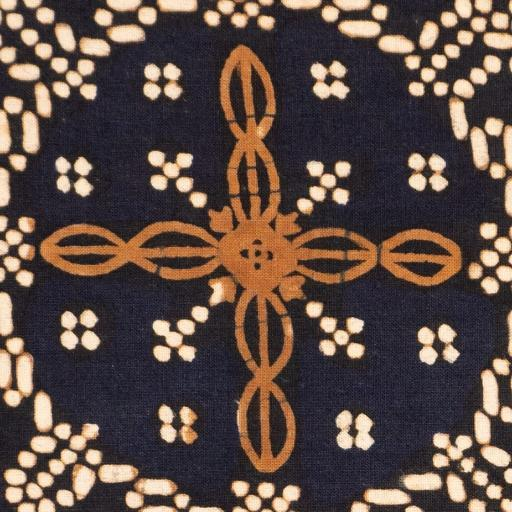


──────────────────────────────
1B. GENERASI DESKRIPSI VISUAL (BLIP-2)
──────────────────────────────
**Deskripsi Visual (BLIP-2):** The color is dark blue, with a slightly faded red border on each side (the light colored area in front being where they intersect), which makes it look as if there's some kind …

2A. Mencari 5 gambar terdekat untuk Query Gambar...

──────────────────────────────
2. HASIL RETRIEVAL CLIP (Top-5 Gambar Terdekat)
──────────────────────────────

--- Rank #1 (1 Sekar Kemuning 1.jpg) ---


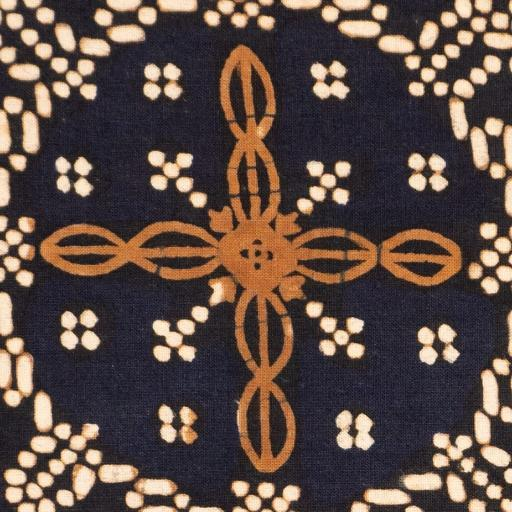

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...

***Gambar Query ASLI digunakan sebagai Base Image untuk Stable Diffusion.***

--- Rank #2 (1 Sekar Kemuning 1_rotate_90.jpg) ---


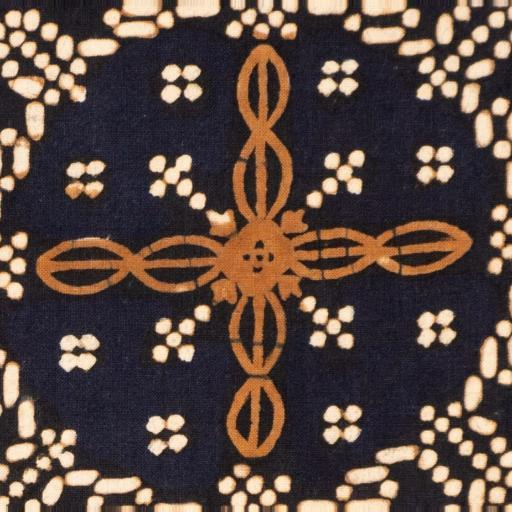

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...

--- Rank #3 (1 Sekar Kemuning 2_rotate_180.jpg) ---


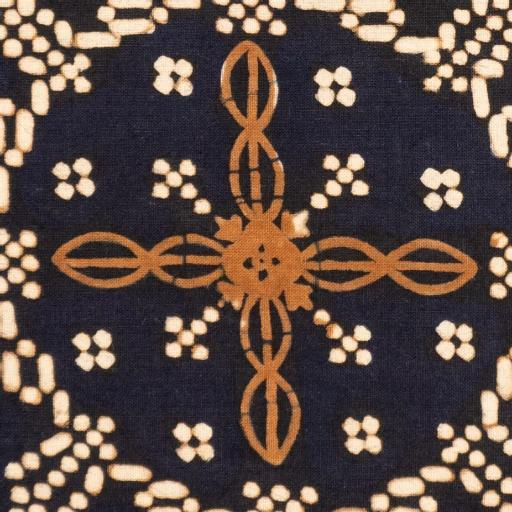

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...

--- Rank #4 (1 Sekar Kemuning 1_rotate_270.jpg) ---


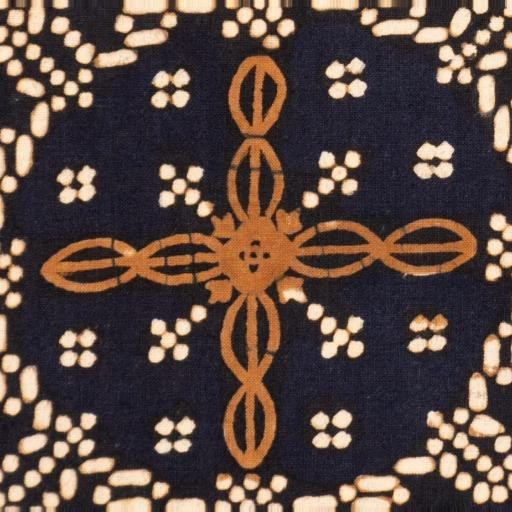

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...

--- Rank #5 (1 Sekar Kemuning 2.jpg) ---


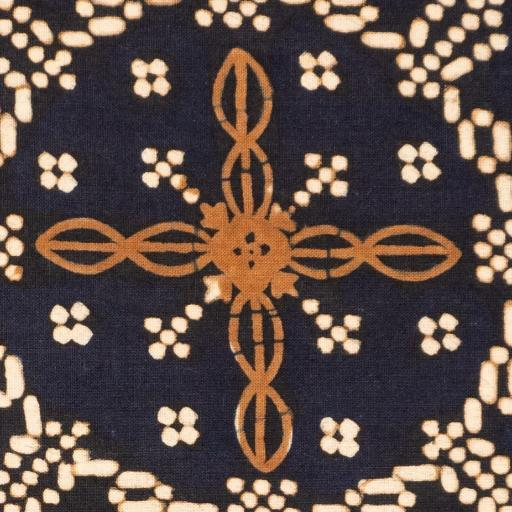

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...

3. FINAL PROMPT FUSION DUAL-QUERY
Prompt Akhir: A high-quality, highly detailed symmetrical Batik Nitik pattern, yellow and black color, Sekar Kemuning motif. A high-quality, highly detailed symmetrical Batik Nitik pattern. Visually described as: The color is dark blue, with a slightly faded red border on each side (the light colored area in front being where they intersect), which makes it look as if there's some kind …. Contextual Knowledge Base from Top-5 Batik Motifs: Motif Sekar Kemuning Context: Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr... | Motif Sekar Kemuning Context: Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jen

Token indices sequence length is longer than the specified maximum sequence length for this model (389 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["makes it look as if there 's some kind …. contextual knowledge base from top - 5 batik motifs : motif sekar kemuning context : dalam masyarakat jawa , pohon kemuning ( murraya paniculata ) termasuk bunganya merupakan jenis tanaman yang mempunyai makna khusus . di kr ... | motif sekar kemuning context : dalam masyarakat jawa , pohon kemuning ( murraya paniculata ) termasuk bunganya merupakan jenis tanaman yang mempunyai makna khusus . di kr ... | motif sekar kemuning context : dalam masyarakat jawa , pohon kemuning ( murraya paniculata ) termasuk bunganya merupakan jenis tanaman yang mempunyai makna khusus . di kr ... | motif sekar kemuning context : dalam masyarakat jawa , pohon kemuning ( murraya panicul

  0%|          | 0/50 [00:00<?, ?it/s]


4. HASIL GENERASI STABLE DIFFUSION AKHIR
✅ GENERASI SELESAI! (Base Image: 1 Sekar Kemuning 1.jpg)


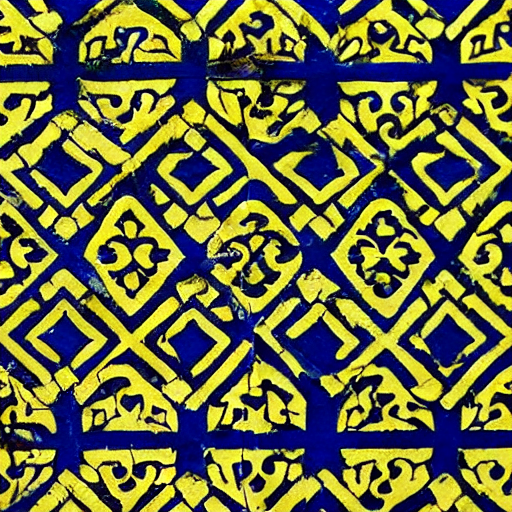

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from PIL import Image
from transformers import CLIPProcessor, CLIPModel, Blip2Processor, Blip2ForConditionalGeneration
from diffusers import StableDiffusionPipeline
import faiss
from IPython.display import display

# =========================================================
# 0. KONFIGURASI DAN PEMUATAN DATA AWAL
# =========================================================
CONFIG = {
    "output_model_dir": "/content/blip2_batik_qlora_v2",
    "metadata_path": "/content/data/Batik Nitik 960/Metadata/Batik Nitik 960 Metadata - Indonesian English v3.xlsx",
    "preprocessed_sd_dir": "/content/data/preprocessed/sd",
    "clip_outputs_dir": "/content/outputs",
}
device = "cuda" if torch.cuda.is_available() else "cpu"

print("--- 0. SETUP DAN PEMUATAN DATA ---")

# 0A. PERBAIKAN METADATA LOOKUP (Menggunakan Nama Motif sebagai Key)
print("--- 0A. Perbaikan Metadata Lookup (Key: Nama Motif) ---")
try:
    # 1. Muat metadata dan bersihkan nama kolom
    df_raw = pd.read_excel(CONFIG["metadata_path"])
    df_raw.columns = df_raw.columns.str.strip()

    # 2. Buat kolom teks (Jawaban Faktual)
    df_raw['text'] = df_raw.apply(
        lambda row: f"Question: Jelaskan nama motif batik ini, deskripsi, dan filosofi lengkapnya. Answer: Nama motif ini adalah {row['Batik Nitik Motif']}. Deskripsi detail dan filosofinya adalah: {row['Description']}",
        axis=1
    )

    # 3. Buat Lookup Table dengan Key = 'Batik Nitik Motif'
    metadata_lookup = df_raw.set_index('Batik Nitik Motif')['text'].to_dict()
    print(f"✅ Lookup Table Metadata Faktual Siap. (Contoh Key: {list(metadata_lookup.keys())[0]})")

except Exception as e:
    print(f"❌ Gagal memuat metadata lookup: {e}. Pastikan file XLSX ada dan kolom 'Batik Nitik Motif' sudah benar.")


# 0B. Muat Model CLIP (Minggu 1)
print("🔹 Loading CLIP Model...")
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
meta = np.load(os.path.join(CONFIG["clip_outputs_dir"], "clip_metadata.npy"), allow_pickle=True)
index = faiss.read_index(os.path.join(CONFIG["clip_outputs_dir"], "faiss.index"))
print("✅ CLIP & FAISS Siap.")


# 0C. Muat Model BLIP-2 Fine-Tuned (Minggu 2)
print("🔹 Loading BLIP-2 Fine-Tuned (QLoRA)...")
processor = Blip2Processor.from_pretrained(CONFIG["output_model_dir"])
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    torch_dtype=torch.float16,
    device_map="auto"
)
model.load_adapter(CONFIG["output_model_dir"])
model.to(device)
model.eval()
print("✅ BLIP-2 LoRA Siap.")


# 0D. Muat Stable Diffusion (Minggu 3)
print("🔹 Loading Stable Diffusion Pipeline...")
SD_MODEL_ID = "runwayml/stable-diffusion-v1-5"
sd_pipe = StableDiffusionPipeline.from_pretrained(
    SD_MODEL_ID,
    torch_dtype=torch.float16,
    safety_checker=None
).to(device)
print("✅ Stable Diffusion Siap.")


# =========================================================
# 1. FUNGSI UTILITY RAG HIBRIDA
# =========================================================

# Fungsi Pembantu untuk Retrieval Metadata (Hanya Deskripsi/Filosofi)
def retrieve_metadata_by_motif(motif_name):
    if motif_name in metadata_lookup:
        metadata_full = metadata_lookup[motif_name]
        if "Answer: Nama motif ini adalah" in metadata_full:
             return metadata_full.split(". Deskripsi detail dan filosofinya adalah: ")[-1].strip()
        return "Metadata tidak terformat dengan benar."
    return "Metadata tidak ditemukan."

# Fungsi Pembantu untuk mendapatkan Nama Motif saja dari Filename
def get_motif_name(filename):
    """Mengambil Nama Motif (misal 'Sekar Kemuning') dari filename (misal '1 Sekar Kemuning 1.jpg')"""

    base_name = filename.split('.')[0]
    words = base_name.split(' ')

    if len(words) >= 3:
        motif_name = ' '.join(words[1:-1]).strip()
        if motif_name in metadata_lookup:
            return motif_name

    return "Batik Nitik"


# 1B. Generatif Visual (Prompt yang lebih spesifik pada warna dan detail)
def generate_visual_description(img_path):
    """Menggunakan model BLIP-2 Fined-Tuned untuk GENERASI visual singkat."""

    img = Image.open(img_path).convert("RGB")

    prompt_visual = "Question: Describe the exact colors and intricate geometric pattern of this batik. Answer: "

    inputs = processor(images=img, text=prompt_visual, return_tensors="pt").to(device)

    with torch.no_grad():
        generated_ids = model.generate(
            input_ids=inputs.input_ids,
            pixel_values=inputs.pixel_values,
            max_new_tokens=40, # Diperpanjang sedikit untuk detail
            do_sample=True, top_k=50, repetition_penalty=2.0, num_beams=1
        )

    caption = processor.decode(generated_ids[0], skip_special_tokens=True).strip()

    if caption.lower().startswith("question:"):
        caption = caption.split("Answer:")[-1].strip()

    return caption if caption else "Motif visual tidak terdeskripsikan."


# 1C. Embedding Gambar/Teks untuk CLIP
def embed_image_clip(img_path):
    img = Image.open(img_path).convert("RGB")
    inputs = clip_processor(images=img, return_tensors="pt").to(device)
    with torch.no_grad():
        emb = clip_model.get_image_features(**inputs)
    return emb.cpu().numpy().flatten()


# =========================================================
# 2. FUNGSI FUSION DAN GENERASI AKHIR (DUAL QUERY)
# =========================================================

def run_hybrid_rag_to_prompt_dual_query(query_text, query_img_path, visual_desc_query, top_k_retrieval=5):
    """
    Mengintegrasikan Query Teks dan Query Gambar.
    Menerima visual_desc_query yang sudah dihitung sebelumnya untuk efisiensi.
    """

    # 2A. Retrieval CLIP (Menggunakan Query Gambar)
    print(f"\n2A. Mencari {top_k_retrieval} gambar terdekat untuk Query Gambar...")

    # Embed Gambar Query
    query_emb = embed_image_clip(query_img_path).reshape(1, -1).astype("float32")

    # Lanjutkan proses pencarian FAISS
    D, I = index.search(query_emb, top_k_retrieval)
    retrieved_filenames = [meta[idx] for idx in I[0]]

    # 2B. RAG Hibrida: Kumpulkan Konteks dari Top-K
    rich_context_list = []

    # Kumpulkan Konteks Faktual dari Top-5 Retrieval
    for i, filename in enumerate(retrieved_filenames):
        motif_name_ret = get_motif_name(filename)
        factual_metadata = retrieve_metadata_by_motif(motif_name_ret)

        # Ringkas konteks untuk mencegah prompt overload
        context_source = f"Motif {motif_name_ret} Context: {factual_metadata[:150]}..."
        rich_context_list.append(context_source)

    full_rich_context = " | ".join(rich_context_list)

    # 2C. Prompt Akhir (Fusion Dual-Query)
    # Prompt dimulai dengan teks pengguna, didukung visual, dan diperkaya konteks.
    final_prompt = (
        f"{query_text}. A high-quality, highly detailed symmetrical Batik Nitik pattern. "
        f"Visually described as: {visual_desc_query}. " # <--- Menggunakan variabel yang diterima
        f"Contextual Knowledge Base from Top-{top_k_retrieval} Batik Motifs: {full_rich_context}"
    )

    return final_prompt, retrieved_filenames


def generate_batik_motif(fused_prompt, base_img_path, guidance_scale=7.5, num_inference_steps=50, strength=0.55):

    base_img = Image.open(base_img_path).convert("RGB").resize((512,512))

    # Negative prompt diperkuat untuk menolak hasil non-geometris dan warna merah/pink
    negative_prompt = "blurry, low quality, deformed, artifacts, ugly, noise, watermark, cartoon, text, poorly drawn, human faces, disfigured, wrong perspective, abstract, stylized, non-geometric, red, pink, maroon, out of frame"

    print(f"\n3. GENERASI GAMBAR DIMULAI (Base Image: {os.path.basename(base_img_path)})...")

    # Menggunakan Stable Diffusion Img2Img Pipeline
    output = sd_pipe(
        prompt=fused_prompt,
        image=base_img,
        negative_prompt=negative_prompt,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        strength=strength # Kekuatan modifikasi gambar dasar: 0.55 (Nilai optimal Anda)
    ).images[0]

    return output


# =========================================================
# 3. DEMO LENGKAP RAG-GENERATIF (Running Pipeline)
# =========================================================

# 3A. Tentukan Query Gambar dan Teks Anda
USER_QUERY_TEXT = "A high-quality, highly detailed symmetrical Batik Nitik pattern, yellow and black color, Sekar Kemuning motif"
QUERY_IMAGE_FILENAME = "1 Sekar Kemuning 1.jpg"
QUERY_IMAGE_PATH = os.path.join(CONFIG["preprocessed_sd_dir"], QUERY_IMAGE_FILENAME)
TOP_K = 5

print("\n" + "="*80)
print("     DEMO RAG HYBRID GENERATIVE PIPELINE (DUAL-QUERY: TEXT + IMAGE)")
print("="*80)

## --- VISUALISASI PROSES ---

print("\n" + "─"*30)
print("1A. QUERY PENGGUNA")
print("─"*30)
print(f"🖼️ Gambar Query: **{QUERY_IMAGE_FILENAME}**")
print(f"❓ Teks Query: **{USER_QUERY_TEXT}**")
display(Image.open(QUERY_IMAGE_PATH))

# --- NEW STEP: 1B. Generasi Visual BLIP-2 ---
print("\n" + "─"*30)
print("1B. GENERASI DESKRIPSI VISUAL (BLIP-2)")
print("─"*30)
visual_desc_query = generate_visual_description(QUERY_IMAGE_PATH)
print(f"**Deskripsi Visual (BLIP-2):** {visual_desc_query}")


# 3B. Run Fusion RAG
fused_prompt, retrieved_files = run_hybrid_rag_to_prompt_dual_query(
    USER_QUERY_TEXT,
    QUERY_IMAGE_PATH,
    visual_desc_query,
    TOP_K
)

# 3C. Tentukan Gambar Dasar (Menggunakan Gambar Query ASLI sebagai base image)
BASE_IMG_PATH = QUERY_IMAGE_PATH


# 3D. Tampilkan Hasil Retrieval (Top-5)
print("\n" + "─"*30)
print(f"2. HASIL RETRIEVAL CLIP (Top-{TOP_K} Gambar Terdekat)")
print("─"*30)

for i, filename in enumerate(retrieved_files):
    img_path_clip = os.path.join(CONFIG["preprocessed_sd_dir"], filename)

    motif_name_disp = get_motif_name(filename)
    factual_metadata_disp = retrieve_metadata_by_motif(motif_name_disp)

    print(f"\n--- Rank #{i+1} ({filename}) ---")
    display(Image.open(img_path_clip))

    print(f"**Nama Motif:** {motif_name_disp}")
    print(f"**Konteks Faktual:** {factual_metadata_disp[:150]}...")

    if filename == QUERY_IMAGE_FILENAME:
        print("\n***Gambar Query ASLI digunakan sebagai Base Image untuk Stable Diffusion.***")


# 3E. Tampilkan Prompt Fusion
print("\n" + "="*80)
print("3. FINAL PROMPT FUSION DUAL-QUERY")
print("="*80)
print(f"Prompt Akhir: {fused_prompt}")
print(f"Strength Optimal: 0.55 | Guidance Scale: 7.5")


# 3F. Generate Gambar
new_batik_image = generate_batik_motif(
    fused_prompt,
    base_img_path=BASE_IMG_PATH,
    strength=0.55,
    guidance_scale=7.5
)


# 3G. Tampilkan Hasil Generasi Akhir
print("\n" + "="*80)
print("4. HASIL GENERASI STABLE DIFFUSION AKHIR")
print("="*80)
print(f"✅ GENERASI SELESAI! (Base Image: {QUERY_IMAGE_FILENAME})")
display(new_batik_image)

--- 0. SETUP DAN PEMUATAN DATA ---
--- 0A. Perbaikan Metadata Lookup (Key: Nama Motif) ---
✅ Lookup Table Metadata Faktual Siap. (Contoh Key: Sekar Kemuning)
🔹 Loading CLIP Model...
✅ CLIP & FAISS Siap.
🔹 Loading BLIP-2 Fine-Tuned (QLoRA)...


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✅ BLIP-2 LoRA Siap.
🔹 Loading Stable Diffusion Pipeline...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ Stable Diffusion Siap.

     DEMO RAG HYBRID GENERATIVE PIPELINE (ULTIMATE FUSION: FACTUAL + VISUAL)

──────────────────────────────
1. QUERY PENGGUNA (GAMBAR)
──────────────────────────────
🖼️ Gambar Query: **1 Sekar Kemuning 1.jpg**


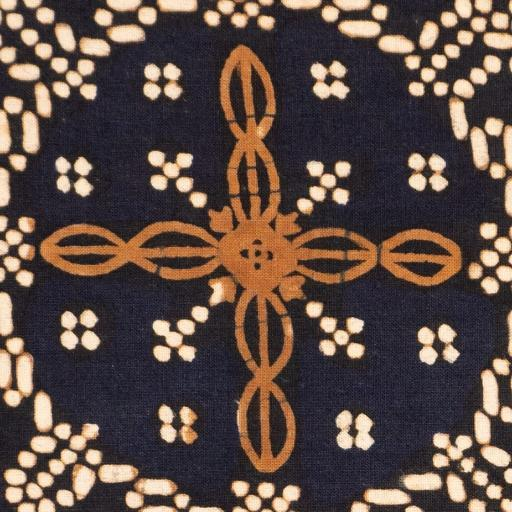


2A. Mencari 5 gambar terdekat untuk Query Gambar...

──────────────────────────────
2. HASIL RETRIEVAL & FUSION KONTEKS (Top-5 Gambar Terdekat)
──────────────────────────────

--- Rank #1 (1 Sekar Kemuning 1.jpg) ---


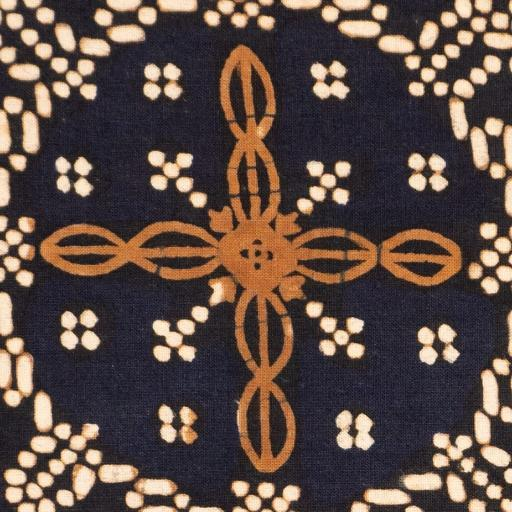

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...
**Deskripsi Visual (BLIP-2):** Pattern has red, yellow dots on each side like a tree trunks which makes it look as if some part is missing off those trees branches so that when you touch them with your hand or brush they

***Gambar Query ASLI digunakan sebagai Base Image untuk Stable Diffusion.***

--- Rank #2 (1 Sekar Kemuning 1_rotate_90.jpg) ---


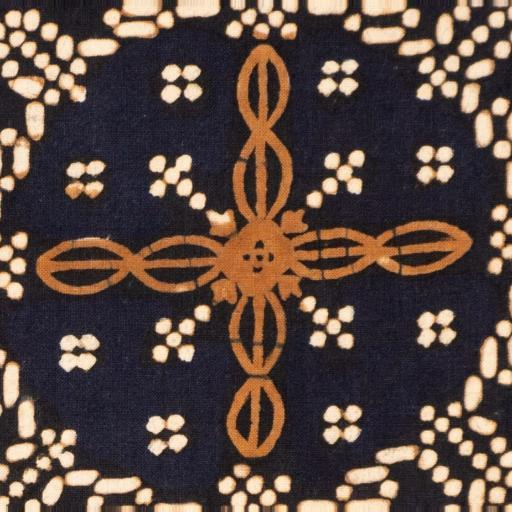

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...
**Deskripsi Visual (BLIP-2):** There are three traditional fabrics used in Indonesia - indigo cloth (masyarakat), cow skin bark-cloth, or bamboo fabric (-wad)

--- Rank #3 (1 Sekar Kemuning 2_rotate_180.jpg) ---


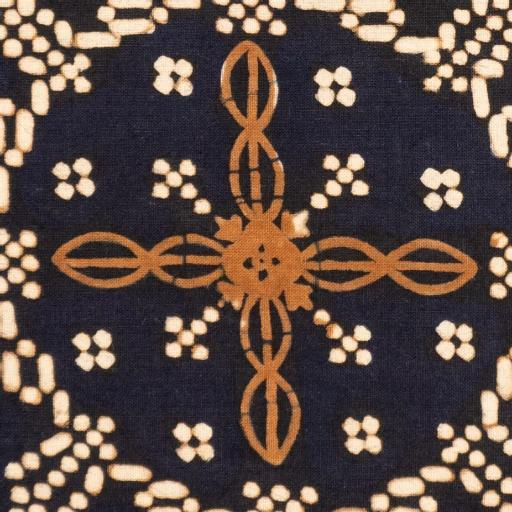

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...
**Deskripsi Visual (BLIP-2):** _________ The precise definition is as follows : a dyed cloth with very fine threads (usually black) that can be woven into designs like squares, rectangles; triangles or other shapes by hand-we

--- Rank #4 (1 Sekar Kemuning 1_rotate_270.jpg) ---


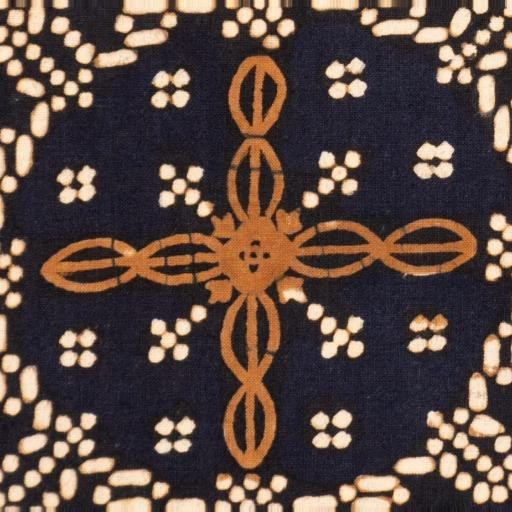

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...
**Deskripsi Visual (BLIP-2):** The main object is to have beautiful designs on it, or a design that can be made into art by using an artists’ chalk pastel (papas).

--- Rank #5 (1 Sekar Kemuning 2.jpg) ---


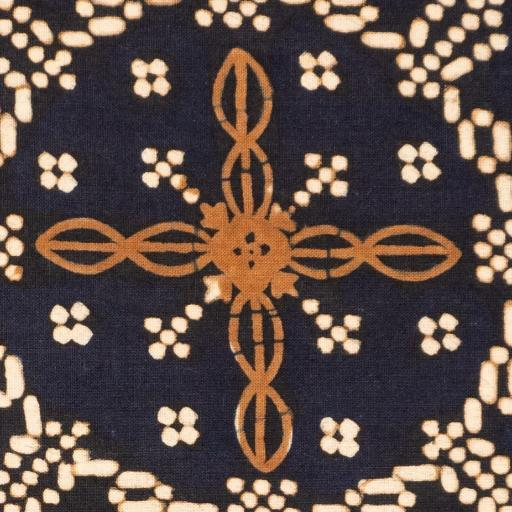

Token indices sequence length is longer than the specified maximum sequence length for this model (539 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['kan jenis tanaman yang mempunyai makna khusus . di kr ... visual details : color used with traditional indonesian batiks is known as " pembayaran ". pattern consist mainly on small designs , including horizontal / vertical motifs such ... | motif sekar kemuning : factual context : dalam masyarakat jawa , pohon kemuning ( murraya paniculata ) termasuk bunganya merupakan jenis tanaman yang mempunyai makna khusus . di kr ... visual details : the design is a cross in yellow dots , with blue points on either side as well ; three vertical stripes at about 1 ¾ " apart extend up from that point to form an outer circle also containing | motif sekar kemuning : factual context : dalam masyarakat jawa , pohon kemunin

**Nama Motif:** Sekar Kemuning
**Konteks Faktual:** Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr...
**Deskripsi Visual (BLIP-2):** I'm pretty sure it is red on back or front, black (or something other than) in between...

3. FINAL PROMPT ULTIMATE FUSION
Prompt Akhir: A masterpiece symmetrical Batik Nitik pattern of the Sekar Kemuning motif, highly detailed and intricate Indonesian fabric. Contextual Inspiration from Top-5 Batiks: Motif Sekar Kemuning: Factual Context: Dalam   masyarakat   Jawa,   pohon   Kemuning   (Murraya paniculata) termasuk bunganya merupakan jenis tanaman yang  mempunyai  makna  khusus.  Di  Kr... Visual Details: Color used with traditional Indonesian Batiks is known as "pembayaran". Pattern consist mainly on small designs, including horizontal/vertical motifs such... | Motif Sekar Kemuning: Factual Context: Dalam   masyarakat   Jawa,   pohon   Kemuning   (Mur

  0%|          | 0/50 [00:00<?, ?it/s]


4. HASIL GENERASI STABLE DIFFUSION AKHIR
✅ GENERASI SELESAI! (Base Image: 1 Sekar Kemuning 1.jpg)


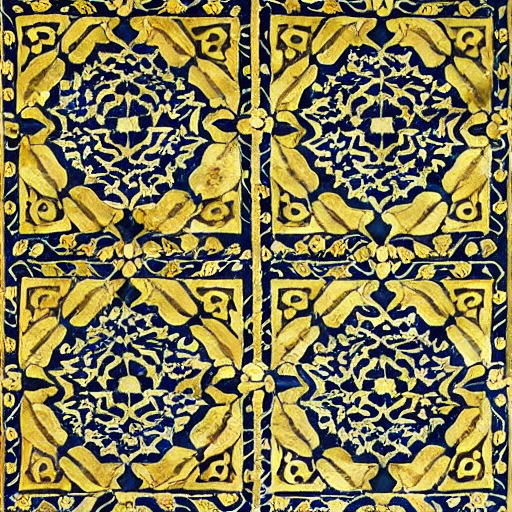

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from PIL import Image
from transformers import CLIPProcessor, CLIPModel, Blip2Processor, Blip2ForConditionalGeneration
from diffusers import StableDiffusionPipeline
import faiss
from IPython.display import display

# =========================================================
# 0. KONFIGURASI DAN PEMUATAN DATA AWAL
# =========================================================
CONFIG = {
    "output_model_dir": "/content/blip2_batik_qlora_v2",
    "metadata_path": "/content/data/Batik Nitik 960/Metadata/Batik Nitik 960 Metadata - Indonesian English v3.xlsx",
    "preprocessed_sd_dir": "/content/data/preprocessed/sd",
    "clip_outputs_dir": "/content/outputs",
}
device = "cuda" if torch.cuda.is_available() else "cpu"

print("--- 0. SETUP DAN PEMUATAN DATA ---")

# 0A. PERBAIKAN METADATA LOOKUP (Menggunakan Nama Motif sebagai Key)
print("--- 0A. Perbaikan Metadata Lookup (Key: Nama Motif) ---")
try:
    # 1. Muat metadata dan bersihkan nama kolom
    df_raw = pd.read_excel(CONFIG["metadata_path"])
    df_raw.columns = df_raw.columns.str.strip()

    # 2. Buat kolom teks (Jawaban Faktual)
    df_raw['text'] = df_raw.apply(
        lambda row: f"Question: Jelaskan nama motif batik ini, deskripsi, dan filosofi lengkapnya. Answer: Nama motif ini adalah {row['Batik Nitik Motif']}. Deskripsi detail dan filosofinya adalah: {row['Description']}",
        axis=1
    )

    # 3. Buat Lookup Table dengan Key = 'Batik Nitik Motif'
    metadata_lookup = df_raw.set_index('Batik Nitik Motif')['text'].to_dict()
    print(f"✅ Lookup Table Metadata Faktual Siap. (Contoh Key: {list(metadata_lookup.keys())[0]})")

except Exception as e:
    print(f"❌ Gagal memuat metadata lookup: {e}. Pastikan file XLSX ada dan kolom 'Batik Nitik Motif' sudah benar.")


# 0B. Muat Model CLIP (Minggu 1)
print("🔹 Loading CLIP Model...")
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
meta = np.load(os.path.join(CONFIG["clip_outputs_dir"], "clip_metadata.npy"), allow_pickle=True)
index = faiss.read_index(os.path.join(CONFIG["clip_outputs_dir"], "faiss.index"))
print("✅ CLIP & FAISS Siap.")


# 0C. Muat Model BLIP-2 Fine-Tuned (Minggu 2)
print("🔹 Loading BLIP-2 Fine-Tuned (QLoRA)...")
processor = Blip2Processor.from_pretrained(CONFIG["output_model_dir"])
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    torch_dtype=torch.float16,
    device_map="auto"
)
model.load_adapter(CONFIG["output_model_dir"])
model.to(device)
model.eval()
print("✅ BLIP-2 LoRA Siap.")


# 0D. Muat Stable Diffusion (Minggu 3)
print("🔹 Loading Stable Diffusion Pipeline...")
SD_MODEL_ID = "runwayml/stable-diffusion-v1-5"
sd_pipe = StableDiffusionPipeline.from_pretrained(
    SD_MODEL_ID,
    torch_dtype=torch.float16,
    safety_checker=None
).to(device)
print("✅ Stable Diffusion Siap.")


# =========================================================
# 1. FUNGSI UTILITY RAG HIBRIDA
# =========================================================

# Fungsi Pembantu untuk Retrieval Metadata (Hanya Deskripsi/Filosofi)
def retrieve_metadata_by_motif(motif_name):
    """Mengambil hanya bagian deskripsi/filosofi faktual dari lookup table."""
    if motif_name in metadata_lookup:
        metadata_full = metadata_lookup[motif_name]
        # Cari hanya bagian deskripsi/filosofi
        if "Answer: Nama motif ini adalah" in metadata_full:
             return metadata_full.split(". Deskripsi detail dan filosofinya adalah: ")[-1].strip()
        return "Metadata tidak terformat dengan benar."
    return "Metadata tidak ditemukan."

# Fungsi Pembantu untuk mendapatkan Nama Motif saja dari Filename
def get_motif_name(filename):
    """Mengambil Nama Motif (misal 'Sekar Kemuning') dari filename (misal '1 Sekar Kemuning 1.jpg')"""

    base_name = filename.split('.')[0]
    words = base_name.split(' ')

    if len(words) >= 3:
        motif_name = ' '.join(words[1:-1]).strip()
        if motif_name in metadata_lookup:
            return motif_name

    return "Batik Nitik"


# 1B. Generatif Visual (BLIP-2)
def generate_visual_description(img_path):
    """Menggunakan model BLIP-2 Fined-Tuned untuk GENERASI visual singkat."""

    img = Image.open(img_path).convert("RGB")
    prompt_visual = "Question: Describe the exact colors and intricate geometric pattern of this batik. Answer: "

    inputs = processor(images=img, text=prompt_visual, return_tensors="pt").to(device)

    with torch.no_grad():
        generated_ids = model.generate(
            input_ids=inputs.input_ids,
            pixel_values=inputs.pixel_values,
            max_new_tokens=40,
            do_sample=True, top_k=50, repetition_penalty=2.0, num_beams=1
        )

    caption = processor.decode(generated_ids[0], skip_special_tokens=True).strip()

    if caption.lower().startswith("question:"):
        caption = caption.split("Answer:")[-1].strip()

    return caption if caption else "Motif visual tidak terdeskripsikan."


# 1C. Embedding Gambar/Teks untuk CLIP
def embed_image_clip(img_path):
    img = Image.open(img_path).convert("RGB")
    inputs = clip_processor(images=img, return_tensors="pt").to(device)
    with torch.no_grad():
        emb = clip_model.get_image_features(**inputs)
    return emb.cpu().numpy().flatten()


# =========================================================
# 2. FUNGSI FUSION DAN GENERASI AKHIR (ULTIMATE FUSION)
# =========================================================

def retrieve_and_fuse_prompt(query_img_path, top_k_retrieval=5):
    """
    Menggunakan CLIP Image-to-Image Retrieval untuk menemukan Top-K,
    lalu menggabungkan Factual Metadata dan Generative Captions dari Top-K tersebut
    menjadi satu prompt yang kaya.
    """

    # 2A. Retrieval CLIP (Menggunakan Query Gambar)
    print(f"\n2A. Mencari {top_k_retrieval} gambar terdekat untuk Query Gambar...")

    query_emb = embed_image_clip(query_img_path).reshape(1, -1).astype("float32")

    D, I = index.search(query_emb, top_k_retrieval)
    retrieved_filenames = [meta[idx] for idx in I[0]]

    # 2B. RAG Hibrida: Kumpulkan Konteks dari Top-K
    fused_elements = []

    for filename in retrieved_filenames:
        img_path_sd = os.path.join(CONFIG["preprocessed_sd_dir"], filename)

        motif_name = get_motif_name(filename)
        # Ambil Konteks Faktual (Filosofi)
        factual_metadata = retrieve_metadata_by_motif(motif_name)
        # Ambil Konteks Generatif (Visual)
        visual_desc = generate_visual_description(img_path_sd)

        fused_element = (
            f"Motif {motif_name}: Factual Context: {factual_metadata[:150]}... "
            f"Visual Details: {visual_desc}"
        )
        fused_elements.append(fused_element)

    full_rich_context = " | ".join(fused_elements)

    # 2C. Prompt Akhir (Fusion)
    query_motif_name = get_motif_name(os.path.basename(query_img_path))

    # Prompt Utama fokus pada motif query, didukung oleh semua konteks yang dikumpulkan.
    final_prompt = (
        f"A masterpiece symmetrical Batik Nitik pattern of the {query_motif_name} motif, "
        f"highly detailed and intricate Indonesian fabric. "
        f"Contextual Inspiration from Top-{top_k_retrieval} Batiks: {full_rich_context}"
    )

    return final_prompt, retrieved_filenames


def generate_batik_motif(fused_prompt, base_img_path, guidance_scale=7.5, num_inference_steps=50, strength=0.55):

    base_img = Image.open(base_img_path).convert("RGB").resize((512,512))

    # Negative prompt diperkuat untuk menolak hasil non-geometris dan warna merah/pink
    negative_prompt = "blurry, low quality, deformed, artifacts, ugly, noise, watermark, cartoon, text, poorly drawn, human faces, disfigured, wrong perspective, abstract, stylized, non-geometric, red, pink, maroon, out of frame"

    print(f"\n3. GENERASI GAMBAR DIMULAI (Base Image: {os.path.basename(base_img_path)})...")

    # Menggunakan Stable Diffusion Img2Img Pipeline
    output = sd_pipe(
        prompt=fused_prompt,
        image=base_img,
        negative_prompt=negative_prompt,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        strength=strength
    ).images[0]

    return output


# =========================================================
# 3. DEMO LENGKAP RAG-GENERATIF (Running Pipeline)
# =========================================================

# 3A. Tentukan Query Gambar Anda
# Kita akan menggunakan gambar Sekar Kemuning sebagai contoh query
QUERY_IMAGE_FILENAME = "1 Sekar Kemuning 1.jpg"
QUERY_IMAGE_PATH = os.path.join(CONFIG["preprocessed_sd_dir"], QUERY_IMAGE_FILENAME)
TOP_K = 5

print("\n" + "="*80)
print("     DEMO RAG HYBRID GENERATIVE PIPELINE (ULTIMATE FUSION: FACTUAL + VISUAL)")
print("="*80)

## --- VISUALISASI PROSES ---

print("\n" + "─"*30)
print("1. QUERY PENGGUNA (GAMBAR)")
print("─"*30)
print(f"🖼️ Gambar Query: **{QUERY_IMAGE_FILENAME}**")
display(Image.open(QUERY_IMAGE_PATH))

# 3B. Run Fusion RAG
fused_prompt, retrieved_files = retrieve_and_fuse_prompt(QUERY_IMAGE_PATH, TOP_K)

# 3C. Tentukan Gambar Dasar (Menggunakan Gambar Query ASLI sebagai base image)
BASE_IMG_PATH = QUERY_IMAGE_PATH


# 3D. Tampilkan Hasil Retrieval (Top-5)
print("\n" + "─"*30)
print(f"2. HASIL RETRIEVAL & FUSION KONTEKS (Top-{TOP_K} Gambar Terdekat)")
print("─"*30)

for i, filename in enumerate(retrieved_files):
    img_path_clip = os.path.join(CONFIG["preprocessed_sd_dir"], filename)

    motif_name_disp = get_motif_name(filename)
    factual_metadata_disp = retrieve_metadata_by_motif(motif_name_disp)
    visual_desc_disp = generate_visual_description(img_path_clip) # Dipanggil ulang untuk display lengkap

    print(f"\n--- Rank #{i+1} ({filename}) ---")
    display(Image.open(img_path_clip))

    print(f"**Nama Motif:** {motif_name_disp}")
    print(f"**Konteks Faktual:** {factual_metadata_disp[:150]}...")
    print(f"**Deskripsi Visual (BLIP-2):** {visual_desc_disp}") # <--- Sekarang ditampilkan

    if filename == QUERY_IMAGE_FILENAME:
        print("\n***Gambar Query ASLI digunakan sebagai Base Image untuk Stable Diffusion.***")


# 3E. Tampilkan Prompt Fusion
print("\n" + "="*80)
print("3. FINAL PROMPT ULTIMATE FUSION")
print("="*80)
print(f"Prompt Akhir: {fused_prompt}")
print(f"Strength Optimal: 0.55 | Guidance Scale: 7.5")


# 3F. Generate Gambar
new_batik_image = generate_batik_motif(
    fused_prompt,
    base_img_path=BASE_IMG_PATH,
    strength=0.55,
    guidance_scale=7.5
)


# 3G. Tampilkan Hasil Generasi Akhir
print("\n" + "="*80)
print("4. HASIL GENERASI STABLE DIFFUSION AKHIR")
print("="*80)
print(f"✅ GENERASI SELESAI! (Base Image: {QUERY_IMAGE_FILENAME})")
display(new_batik_image)

In [ ]:
!pip install evaluate rouge_score pytorch_fid

import torch
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cdist
from sklearn.metrics import average_precision_score
from IPython.display import display
import evaluate
from pytorch_fid import fid_score
import faiss
from transformers import CLIPProcessor, CLIPModel, Blip2Processor, Blip2ForConditionalGeneration
from diffusers import StableDiffusionPipeline
import os

# =========================================================
# 0. KONFIGURASI DAN PEMUATAN DEPENDENSI
# =========================================================
CONFIG = {
    "output_model_dir": "/content/blip2_batik_qlora_v2", # BLIP-2 LoRA
    "metadata_path": "/content/data/Batik Nitik 960/Metadata/Batik Nitik 960 Metadata - Indonesian English v3.xlsx",
    "preprocessed_clip_dir": "/content/data/preprocessed/clip", # Path untuk image query & retrieval
    "preprocessed_sd_dir": "/content/data/preprocessed/sd", # Path untuk base image SD
    "clip_outputs_dir": "/content/outputs", # Path untuk FAISS index & metadata
}
device = "cuda" if torch.cuda.is_available() else "cpu"

print("--- 0. SETUP DAN PEMUATAN MODEL ---")

# 0A. Load CLIP (Digunakan oleh embed_image)
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# 0B. Load BLIP-2 Fine-Tuned (Digunakan oleh generate_caption)
processor = Blip2Processor.from_pretrained(CONFIG["output_model_dir"])
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    torch_dtype=torch.float16,
    device_map="auto"
)
model.load_adapter(CONFIG["output_model_dir"])
model.to(device)
model.eval()

# 0C. Load Stable Diffusion (Opsional)
SD_MODEL_ID = "runwayml/stable-diffusion-v1-5"
sd_pipe = StableDiffusionPipeline.from_pretrained(
    SD_MODEL_ID,
    torch_dtype=torch.float16,
    safety_checker=None
).to(device)

# 0D. Load Data
bleu = evaluate.load("bleu")
rouge = evaluate.load("rouge")

# Cek & Load Data (Pastikan path ini ada)
try:
    index = faiss.read_index(os.path.join(CONFIG["clip_outputs_dir"], "faiss.index"))
    embeddings = np.load(os.path.join(CONFIG["clip_outputs_dir"], "clip_embeddings.npy"))
    meta = np.load(os.path.join(CONFIG["clip_outputs_dir"], "clip_metadata.npy"), allow_pickle=True)
    print("✅ Semua Model dan Data Evaluasi Siap.")
except Exception as e:
    print(f"❌ ERROR: Gagal memuat data FAISS/Embeddings. Pastikan path {CONFIG['clip_outputs_dir']} sudah benar. Detail: {e}")


# =========================================================
# 1. UTILITY FUNCTIONS (TAMBAHAN UNTUK METRICS)
# =========================================================

def get_motif_name_from_filename(filename):
    """Extracts the motif name from file format '1 Sekar Kemuning 1.jpg'"""
    base_name = os.path.basename(filename).split('.')[0]
    words = base_name.split(' ')
    if len(words) >= 3:
        return ' '.join(words[1:-1]).strip()
    return "Unknown Motif"

def embed_image(img_path):
    img = Image.open(img_path).convert("RGB")
    inputs = clip_processor(images=img, return_tensors="pt").to(device)

    with torch.no_grad():
        emb = clip_model.get_image_features(**inputs)

    return emb.cpu().numpy().flatten()

def generate_caption(image_path):
    """Menggunakan model BLIP-2 fine-tuned untuk captioning."""
    image = Image.open(image_path).convert("RGB")
    prompt_visual = "Question: Describe the colors and intricate geometric pattern of this batik. Answer:"
    inputs = processor(images=image, text=prompt_visual, return_tensors="pt").to(device)

    with torch.no_grad():
        pred = model.generate(
            input_ids=inputs.input_ids,
            pixel_values=inputs.pixel_values,
            max_new_tokens=50,
            do_sample=True, top_k=50, repetition_penalty=2.0, num_beams=1
        )

    caption = processor.decode(pred[0], skip_special_tokens=True).strip()

    if caption.lower().startswith("question:"):
        caption = caption.split("Answer:")[-1].strip()

    return caption if caption else "Motif visual tidak terdeskripsikan."


# =========================================================
# 2. METRIC FUNCTIONS
# =========================================================

def retrieval_metrics(query_emb, query_image_filename, topk=5):
    """Menghitung Top-K Accuracy dan mAP berdasarkan kesamaan nama motif."""
    D, I = index.search(query_emb.reshape(1,-1).astype("float32"), len(embeddings))

    query_motif_name = get_motif_name_from_filename(query_image_filename)

    labels = np.array([
        1 if query_motif_name == get_motif_name_from_filename(meta[idx]) else 0
        for idx in I[0]
    ])

    topk_acc = labels[:topk].sum() / topk

    if np.sum(labels) == 0:
        mean_ap = 0.0
    else:
        mean_ap = average_precision_score(labels, -D[0])

    return topk_acc, mean_ap


def caption_scores(real_caption, generated_caption):
    """Menghitung skor BLEU dan ROUGE-L untuk perbandingan teks."""
    bleu_score = bleu.compute(predictions=[generated_caption], references=[[real_caption]])["bleu"]

    rouge_result = rouge.compute(predictions=[generated_caption], references=[real_caption])["rougeL"]

    rouge_value = rouge_result.mid.fmeasure if hasattr(rouge_result, 'mid') else rouge_result

    return bleu_score, rouge_value


def semantic_similarity(img1_path, img2_path):
    """
    Menghitung Cosine Similarity dan L2 Distance antara dua embedding gambar.
    FIXED: Memperbaiki input cdist agar menjadi array 2D (1, N) tanpa list tambahan.
    """
    emb1 = embed_image(img1_path)
    emb2 = embed_image(img2_path)

    # Cosine Similarity (scikit-learn expects list of arrays or 2D array)
    cos_sim = cosine_similarity([emb1], [emb2])[0][0]

    # L2 Distance (cdist expects 2D array: (1, N))
    l2_dis = cdist(emb1.reshape(1,-1), emb2.reshape(1,-1), metric='euclidean')[0][0]

    return cos_sim, l2_dis


# =========================================================
# 3. RUN PIPELINE EVALUATION
# =========================================================

print("\n🔍 Running Full Evaluation Pipeline...")

# Pilih salah satu gambar dari folder untuk dijadikan query
QUERY_FILENAME = "1 Sekar Kemuning 1.jpg"
query_image = os.path.join(CONFIG["preprocessed_clip_dir"], QUERY_FILENAME)
TOP_K = 5

print(f"Query image set to: {query_image}")

# Step 1: Retrieval
query_emb = embed_image(query_image)
D, I = index.search(query_emb.reshape(1,-1).astype("float32"), TOP_K)

retrieved = []
for idx in I[0]:
    fname = meta[idx]
    img_path = os.path.join(CONFIG["preprocessed_clip_dir"], fname)
    caption_text = generate_caption(img_path)
    retrieved.append((fname, caption_text))

# Step 2: Build Prompt (Fusion Prompt)
generated_prompt = "A traditional Batik Nitik geometric pattern influenced by: " + "; ".join([cap for _, cap in retrieved])

# Step 3: Retrieval Metrics
topk_acc, mean_ap = retrieval_metrics(query_emb, QUERY_FILENAME, topk=TOP_K)

# Step 4: Caption Metrics
real_caption = retrieved[0][1]
bleu_score, rougeL_score = caption_scores(real_caption, generated_prompt)

# Step 5: Similarity Metrics (Query Image vs. Top-1 Retrieved Image)
top1_img = os.path.join(CONFIG["preprocessed_clip_dir"], retrieved[0][0])
cos_sim, l2_dist = semantic_similarity(query_image, top1_img)

# Step 6: FID placeholder
fid_value = "Pending Batch Generation (Requires generating a batch of images)"

# -----------------------------
#  REPORT
# -----------------------------
print("\n" + "="*50)
print("📌 FINAL EVALUATION REPORT")
print("="*50)
print(f"**Query Image:** {QUERY_FILENAME}")
print(f"**Generated Prompt (Fusion):** {generated_prompt[:100]}...")
print("──────────────────────────────────────────────")
print(f"**[I. Retrieval Accuracy]**")
print(f"🔹 Top-{TOP_K} Accuracy:        {topk_acc:.3f}")
print(f"🔹 Mean Average Precision (mAP): {mean_ap:.3f}")
print("──────────────────────────────────────────────")
print(f"**[II. Semantic Similarity]** (Query vs Top-1 Retrieval)")
print(f"🔹 Cosine Similarity:          {cos_sim:.3f}")
print(f"🔹 L2 Distance:                {l2_dist:.3f}")
print("──────────────────────────────────────────────")
print(f"**[III. Prompt Quality]** (Fusion Prompt vs Top-1 Caption)")
print(f"🔹 BLEU Score:                  {bleu_score:.3f}")
print(f"🔹 ROUGE-L Score:               {rougeL_score:.3f}")
print("──────────────────────────────────────────────")
print(f"**[IV. Generative Quality]**")
print(f"🔹 FID Score:                  {fid_value}")
print("="*50)
print("\n🧪 Evaluation Completed Successfully.\n")

--- 0. SETUP DAN PEMUATAN MODEL ---


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


✅ Semua Model dan Data Evaluasi Siap.

🔍 Running Full Evaluation Pipeline...
Query image set to: /content/data/preprocessed/clip/1 Sekar Kemuning 1.jpg

📌 FINAL EVALUATION REPORT
**Query Image:** 1 Sekar Kemuning 1.jpg
**Generated Prompt (Fusion):** A traditional Batik Nitik geometric pattern influenced by: The artwork is created using a mix betwee...
──────────────────────────────────────────────
**[I. Retrieval Accuracy]**
🔹 Top-5 Accuracy:        1.000
🔹 Mean Average Precision (mAP): 0.009
──────────────────────────────────────────────
**[II. Semantic Similarity]** (Query vs Top-1 Retrieval)
🔹 Cosine Similarity:          1.000
🔹 L2 Distance:                0.000
──────────────────────────────────────────────
**[III. Prompt Quality]** (Fusion Prompt vs Top-1 Caption)
🔹 BLEU Score:                  0.102
🔹 ROUGE-L Score:               0.206
──────────────────────────────────────────────
**[IV. Generative Quality]**
🔹 FID Score:                  Pending Batch Generation (Requires gener